In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import pyAgrum as gum
import matplotlib.pyplot as plt
import pyAgrum.lib.notebook as gnb
import plotly.express as px
import plotly as py

In [87]:
path = "/Users/louisedubois/Desktop/statap/allegations.csv"
df=pd.read_csv(path,sep=",")

df=df[df['year_received']>=2000]
df.shape

18589    20
18731    19
14714    19
10039    19
11185    18
         ..
2601      1
25990     1
25979     1
25968     1
9992      1
Name: unique_mos_id, Length: 3543, dtype: int64

In [20]:
#Histogram pour voir quelle année il y a eu le plus de plaintes déposées 
fig=px.histogram(df, x='year_received')
fig.show()
#faire des stat sur les plaintes couplées 

In [97]:
df_total=df.drop_duplicates(subset="complaint_id")
a=df_total['complaint_id'].value_counts()
print(a)
df_nb_plaint=pd.DataFrame(df_total['unique_mos_id'].value_counts())
df_nb_plaint=df_nb_plaint.reset_index()
#fig =px.histogram(df5, x='unique_mos_id')
#fig.show()
print(df_nb_plaint.shape)
#on récupère le ombre moyens de plaintes par officier et l'écart type du nombre de plainte 
m_2014=df_nb_plaint['unique_mos_id'].mean()
std_2014=df_nb_plaint['unique_mos_id'].std()
print(m_2014,std_2014)
df_nb_plaint=df_nb_plaint.rename(columns={"index":"unique_mos_id",'unique_mos_id':"number_complaint"})

#Il y a 3543 officiers différents dans la base de données, en moyenne un officier recoit 3 plaintes 

42835    1
9691     1
32430    1
5328     1
6837     1
        ..
8921     1
9729     1
10551    1
12342    1
35671    1
Name: complaint_id, Length: 11312, dtype: int64
(3543, 2)
3.1927744848998025 2.643794339815327


In [88]:
df_total=df_total.merge(df_nb_plaint, on="unique_mos_id")

In [90]:
df_high=df_total[df_nb_plaint>m_2014]
df_low=df_total[df_nb_plaint<=m_2014]

In [101]:
df_high['complaint_id'].values()

TypeError: 'numpy.ndarray' object is not callable

In [81]:
#On se concentre d'abord sur une année en particulier 
df_2014=df[df['year_received']==2014]
df1=pd.DataFrame(df_2014['complaint_id'].value_counts())
df5=pd.DataFrame(df_2014['unique_mos_id'].value_counts())
df5=df5.reset_index()
#fig =px.histogram(df5, x='unique_mos_id')
#fig.show()
print(df5.shape)
#on récupère le ombre moyens de plaintes par officier et l'écart type du nombre de plainte 
m_2014=df5['unique_mos_id'].mean()
std_2014=df5['unique_mos_id'].std()
df5=df5.rename(columns={"index":"unique_mos_id",'unique_mos_id':"number_complaint"})
df1

(756, 2)


,complaint_id
31072,20
30261,17
29969,16
31370,15
31796,14
...,...
31206,1
30122,1
30249,1
29775,1


In [74]:
#on crée une nouvelle base de données sans les officiers avec un nombre trop élevé de plainte,
#et sans les officiers avec moins de 3 plaintes, ces officiers sont les complaints prone officer 
df6=df5[df5["number_complaint"]<(m_2014+3*std_2014)]
id=df6["unique_mos_id"].values
df7=df6[df6["number_complaint"]>2]
id_p=df7["unique_mos_id"].values
len(id_p)
df6
#Il y a donc 299 offciers dans la base de données complaints prone 

,unique_mos_id,number_complaint
19,20982,10
20,11676,10
21,23890,9
22,15046,9
23,14681,9
...,...,...
751,25004,1
752,24961,1
753,24959,1
754,24940,1


In [75]:
#D'abord on enlève les officiers avec un trop grand nombre de plainte,
#ensuite on ajoute une colonne avec le nombre de plainte par officier 
#enfin on enlève les colonnes qui ne nous intéresse pas dans l'étude 
df_2014=df_2014[df_2014['unique_mos_id'].isin(id)]

df_2014=df_2014.merge(df6, on="unique_mos_id")

df_2014=df_2014.drop(["complaint_id","month_received","year_received","month_closed","year_closed","complainant_ethnicity",
              "complainant_gender","complainant_age_incident","fado_type","allegation","precinct",
              "contact_reason","outcome_description","board_disposition"], axis=1)


df_2014

,unique_mos_id,first_name,last_name,command_now,shield_no,command_at_incident,rank_abbrev_incident,rank_abbrev_now,rank_now,rank_incident,mos_ethnicity,mos_gender,mos_age_incident,number_complaint
0,10026,Brian,Alexander,079 DET,3185,079 PCT,POM,SGT,Sergeant,Police Officer,White,M,29,1
1,10068,Travis,Brinson,079 PCT,5198,009 PCT,POM,POM,Police Officer,Police Officer,Black,M,31,2
2,10068,Travis,Brinson,079 PCT,5198,009 PCT,POM,POM,Police Officer,Police Officer,Black,M,31,2
3,10085,Keith,Chatterton,079 PCT,7323,079 PCT,POM,POM,Police Officer,Police Officer,White,M,40,1
4,10137,Ted,Holway,079 PCT,17225,NARCBSI,POM,POM,Police Officer,Police Officer,White,M,30,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1949,9666,Sean,Claxton,077 PCT,0,067 PCT,SGT,LT,Lieutenant,Sergeant,Black,M,30,8
1950,9671,Patrick,Craig,077 PCT,26996,077 PCT,POM,POM,Police Officer,Police Officer,White,M,29,3
1951,9671,Patrick,Craig,077 PCT,26996,077 PCT,POM,POM,Police Officer,Police Officer,White,M,29,3
1952,9671,Patrick,Craig,077 PCT,26996,077 PCT,POM,POM,Police Officer,Police Officer,White,M,29,3


In [77]:
df_2014=df_2014.drop_duplicates()
df_2014.to_excel("/Users/louisedubois/Desktop/statap/df_2014.xlsx")

In [ ]:
df_2014_high=df_2014[df_2014['unique_mos_id'].isin(id_p)]
df_2014_low=df_2014[~df_2014['unique_mos_id'].isin(id_p)]
#on crée donc une base de données avec les complaint prone et les autre

In [35]:
df_2014_high.groupby(['mos_ethnicity']).count()


,unique_mos_id,first_name,last_name,command_now,shield_no,complaint_id,month_received,year_received,month_closed,year_closed,...,mos_age_incident,complainant_ethnicity,complainant_gender,complainant_age_incident,fado_type,allegation,precinct,contact_reason,outcome_description,board_disposition
mos_ethnicity,,,,,,,,,,,,,,,,,,,,,
Asian,63,63,63,63,63,63,63,63,63,63,...,63,61,61,61,63,63,63,63,63,63
Black,218,218,218,218,218,218,218,218,218,218,...,218,202,207,207,218,218,218,218,218,218
Hispanic,375,375,375,375,375,375,375,375,375,375,...,375,357,361,356,375,375,375,375,375,375
White,675,675,675,675,675,675,675,675,675,675,...,675,612,620,605,675,675,675,671,675,675


In [43]:
df2=pd.DataFrame(df_new['unique_mos_id'].value_counts())
df2=df2.reset_index()
#fig =px.histogram(df2, x='unique_mos_id')
#fig.show()
df2['unique_mos_id'].describe()
m=df2['unique_mos_id'].mean()
std=df2['unique_mos_id'].std()
print(m,std)

8.124266394488389 7.610987233142896


In [45]:
df_prone=df[df['unique_mos_id'].isin(id)]
#df_prone.to_excel("/Users/louisedubois/Desktop/statap/complaint_prone.xlsx")
df_prone

,unique_mos_id,first_name,last_name,command_now,shield_no,complaint_id,month_received,year_received,month_closed,year_closed,...,mos_age_incident,complainant_ethnicity,complainant_gender,complainant_age_incident,fado_type,allegation,precinct,contact_reason,outcome_description,board_disposition
12,10026,Brian,Alexander,079 DET,3185,35092,5,2016,10,2016,...,30,Black,Male,30.0,Abuse of Authority,Search (of person),79.0,Moving violation,No arrest made or summons issued,Unsubstantiated
13,10026,Brian,Alexander,079 DET,3185,26353,8,2012,2,2014,...,27,Black,Male,35.0,Force,Pepper spray,79.0,PD suspected C/V of violation/crime - street,Arrest - OGA,Unsubstantiated
14,10026,Brian,Alexander,079 DET,3185,27482,3,2013,7,2014,...,27,Black,Female,42.0,Force,Physical force,79.0,Regulatory inspection,Arrest - other violation/crime,Exonerated
15,10026,Brian,Alexander,079 DET,3185,27482,3,2013,7,2014,...,27,Black,Female,42.0,Offensive Language,Race,79.0,Regulatory inspection,Arrest - other violation/crime,Unsubstantiated
16,10026,Brian,Alexander,079 DET,3185,27482,3,2013,7,2014,...,27,Black,Male,46.0,Force,Handcuffs too tight,79.0,Regulatory inspection,Arrest - other violation/crime,Unsubstantiated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33316,9856,Daniel,Zollo,077 PCT,5627,20786,6,2010,4,2011,...,43,Black,Female,46.0,Abuse of Authority,Refusal to process civilian complaint,77.0,Other,Arrest - other violation/crime,Unsubstantiated
33317,9856,Daniel,Zollo,077 PCT,5627,20786,6,2010,4,2011,...,43,Black,Male,39.0,Abuse of Authority,Threat of force (verbal or physical),77.0,Other,Arrest - other violation/crime,Unsubstantiated
33318,9856,Daniel,Zollo,077 PCT,5627,20786,6,2010,4,2011,...,43,Black,Male,39.0,Discourtesy,Word,77.0,Other,Arrest - other violation/crime,Unsubstantiated
33319,9856,Daniel,Zollo,077 PCT,5627,20786,6,2010,4,2011,...,43,Black,Male,39.0,Discourtesy,Word,77.0,Other,Arrest - other violation/crime,Substantiated (Charges)


In [51]:
df_prone['unique_mos_id'].value_counts()

18530    73
23290    42
22730    36
9149     35
6307     33
         ..
15375    11
25797    11
20946    11
25779    11
2530     11
Name: unique_mos_id, Length: 954, dtype: int64

In [73]:
fig =px.histogram(df_prone, x='mos_age_incident',nbins=60)
fig.show()
df_prone['mos_age_incident'].describe()

count    19827.000000
mean        32.644525
std          6.006405
min         21.000000
25%         28.000000
50%         32.000000
75%         36.000000
max         56.000000
Name: mos_age_incident, dtype: float64

In [76]:
fig =px.histogram(df_prone, x='complainant_ethnicity',nbins=60)
fig.show()
df_prone['complainant_ethnicity'].describe()

count     17142
unique        8
top       Black
freq      10745
Name: complainant_ethnicity, dtype: object

In [81]:
df_prone=df_prone[df_prone['complainant_age_incident']>0]
fig =px.histogram(df_prone, x='complainant_age_incident')
fig.show()
df_prone['complainant_age_incident'].describe()

count    16918.000000
mean        32.083875
std         11.837204
min          7.000000
25%         23.000000
50%         30.000000
75%         40.000000
max         87.000000
Name: complainant_age_incident, dtype: float64

In [82]:
fig =px.histogram(df_prone, x='fado_type')
fig.show()
df_prone['fado_type'].describe()

count                  16918
unique                     4
top       Abuse of Authority
freq                    9931
Name: fado_type, dtype: object

In [83]:
fig =px.histogram(df_prone, x='board_disposition')
fig.show()

In [17]:
plt.figure(figsize=(15,8))
plt.hist(df['unique_mos_id'],bins=30000)

(array([10.,  0.,  3., ...,  0.,  0., 15.]),
 array([2.00000000e+00, 3.21240000e+00, 4.42480000e+00, ...,
        3.63715752e+04, 3.63727876e+04, 3.63740000e+04]),
 <BarContainer object of 30000 artists>)

(array([   7.,   22.,   22.,   35.,   49.,   54.,   56.,   88.,   76.,
         177.,  213.,  254.,  214.,  250.,  155.,  232.,  344.,  571.,
         792.,  972., 1345., 1654., 1892., 1631., 1761., 1659., 1896.,
        1841., 2114., 2220., 2312., 2345., 2178., 2281., 1646.]),
 array([1985., 1986., 1987., 1988., 1989., 1990., 1991., 1992., 1993.,
        1994., 1995., 1996., 1997., 1998., 1999., 2000., 2001., 2002.,
        2003., 2004., 2005., 2006., 2007., 2008., 2009., 2010., 2011.,
        2012., 2013., 2014., 2015., 2016., 2017., 2018., 2019., 2020.]),
 <BarContainer object of 35 artists>)

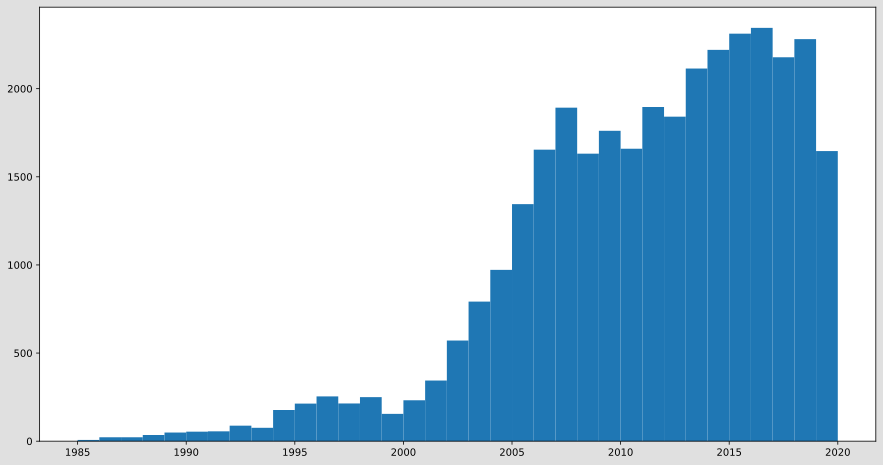

In [3]:
plt.figure(figsize=(15,8))
plt.hist(df['year_received'],bins=35)

In [16]:
nb_evol=df.groupby(['year_received','complainant_ethnicity'])['complaint_id'].count()


AttributeError: 'Series' object has no attribute 'bar'

In [43]:
df.groupby(['complainant_ethnicity'])['index'].count()

complainant_ethnicity
American Indian       64
Asian                532
Black              17114
Hispanic            6424
Other Race           677
Refused              259
Unknown             1041
White               2783
Name: index, dtype: int64

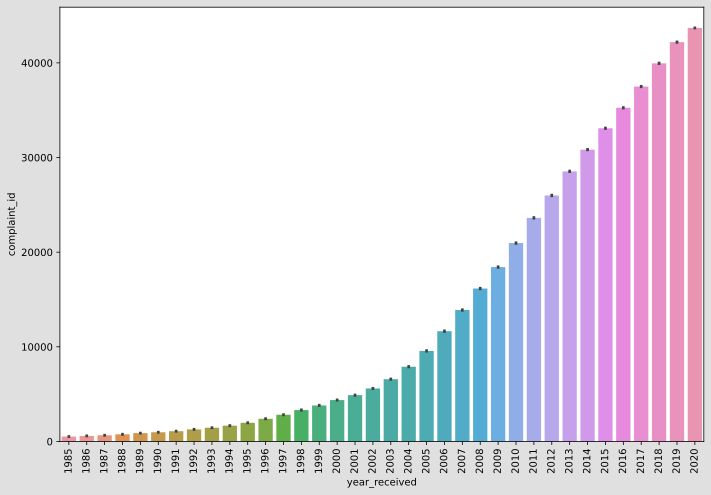

In [9]:
plt.figure(figsize=(10,7))
sns.barplot(x =nb_evol["year_received"], y = df["complaint_id"])
#plt.xlabel('\nDate', fontsize=15, color='#c0392b')
#plt.ylabel("Hashrate mensuel en ES/s \n", fontsize=15, color='#c0392b')
#plt.title("Evolution du hashrate des pays entre 2019 et 2021\n", fontsize=18, color='#e74c3c')
plt.xticks(rotation=90)
plt.tight_layout()

In [4]:
df_short=df.drop(columns=["unique_mos_id","first_name","last_name","complaint_id","outcome_description","contact_reason"])
df_short

,command_now,shield_no,month_received,year_received,month_closed,year_closed,command_at_incident,rank_abbrev_incident,rank_abbrev_now,rank_now,...,mos_ethnicity,mos_gender,mos_age_incident,complainant_ethnicity,complainant_gender,complainant_age_incident,fado_type,allegation,precinct,board_disposition
0,078 PCT,8409,7,2019,5,2020,078 PCT,POM,POM,Police Officer,...,Hispanic,M,32,Black,Female,38.0,Abuse of Authority,Failure to provide RTKA card,78.0,Substantiated (Command Lvl Instructions)
1,078 PCT,5952,11,2011,8,2012,PBBS,POM,POM,Police Officer,...,White,M,24,Black,Male,26.0,Discourtesy,Action,67.0,Substantiated (Charges)
2,078 PCT,5952,11,2011,8,2012,PBBS,POM,POM,Police Officer,...,White,M,24,Black,Male,26.0,Offensive Language,Race,67.0,Substantiated (Charges)
3,078 PCT,5952,7,2012,9,2013,PBBS,POM,POM,Police Officer,...,White,M,25,Black,Male,45.0,Abuse of Authority,Question,67.0,Substantiated (Charges)
4,078 PCT,24058,8,2018,2,2019,078 PCT,POF,POF,Police Officer,...,Hispanic,F,39,NaN,NaN,16.0,Force,Physical force,67.0,Substantiated (Command Discipline A)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33353,078 PCT,2642,8,2016,2,2017,066 PCT,POM,SGT,Sergeant,...,White,M,36,Asian,Male,21.0,Discourtesy,Word,66.0,Unsubstantiated
33354,078 PCT,2642,8,2016,2,2017,066 PCT,POM,SGT,Sergeant,...,White,M,36,Asian,Male,21.0,Abuse of Authority,Interference with recording,66.0,Unsubstantiated
33355,078 PCT,2642,8,2016,2,2017,066 PCT,POM,SGT,Sergeant,...,White,M,36,Asian,Male,21.0,Abuse of Authority,Search (of person),66.0,Substantiated (Formalized Training)
33356,078 PCT,2642,8,2016,2,2017,066 PCT,POM,SGT,Sergeant,...,White,M,36,Asian,Male,21.0,Abuse of Authority,Vehicle search,66.0,Substantiated (Formalized Training)


In [ ]:
df_short.to_csv('/Users/louisedubois/Desktop/statap/bd.csv', index=False)
file = '/Users/louisedubois/Desktop/statap/bd.csv'
learner = gum.BNLearner(file)
bn = learner.learnBN()